# Exploratory Data Analysis

## Import The Libraries

In [4]:
# Basic Package
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statistical Libraries
from scipy.stats import skew,kurtosis
from scipy.stats import zscore

## Settings

In [11]:
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10,5)

## Import The Dataset

In [12]:
# Replace with your own dataset path
# file_path = "your_dataset.csv"
# file_path="Bangladeshi_Student_Database.xlsx"
# df = pd.read_excel(file_path)

file_path = 'Credit_Card_Score.xlsx'
df = pd.read_excel(file_path)

df.head()


,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Monthly_Balance,Payment_Behaviour,Age,...,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Monthly_Inhand_Salary,Changed_Credit_Limit,Outstanding_Debt,Total_EMI_per_month,Credit_Mix,Credit_Score
0,3,7,4,26.822620,265,No,80.415295,312.494089,High_spent_Medium_value_payments,23,...,3,4,3,4,1824.843333,11.27,809.98,49.574949,Good,Good
1,3,7,4,31.944960,265,No,118.280222,284.629162,High_spent_Medium_value_payments,23,...,3,4,3,4,1824.843333,11.27,809.98,49.574949,Good,Good
2,3,7,4,28.609352,267,No,81.699521,331.209863,High_spent_Medium_value_payments,23,...,3,4,3,4,1824.843333,11.27,809.98,49.574949,Good,Good
3,5,4,4,31.377862,268,No,199.458074,223.451310,High_spent_Medium_value_payments,23,...,3,4,3,4,1824.843333,11.27,809.98,49.574949,Good,Good
4,6,4,4,24.797347,269,No,41.420153,341.489231,High_spent_Medium_value_payments,23,...,3,4,3,4,1824.843333,11.27,809.98,49.574949,Good,Good


In [27]:
corr_with_target = df.corr()['Credit_Score'].sort_values(ascending=False)
print(corr_with_target)

ValueError: could not convert string to float: 'No'

## Basic Information

In [13]:
print("Shape:", df.shape)
print("\nColumn Names:\n", df.columns.tolist())
print("\nData Types:\n")
print(df.dtypes)

df.info()

Shape: (9999, 21)

Column Names:
 ['Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Payment_of_Min_Amount', 'Amount_invested_monthly', 'Monthly_Balance', 'Payment_Behaviour', 'Age', 'Annual_Income', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Monthly_Inhand_Salary', 'Changed_Credit_Limit', 'Outstanding_Debt', 'Total_EMI_per_month', 'Credit_Mix', 'Credit_Score']

Data Types:

Delay_from_due_date           int64
Num_of_Delayed_Payment        int64
Num_Credit_Inquiries          int64
Credit_Utilization_Ratio    float64
Credit_History_Age            int64
Payment_of_Min_Amount        object
Amount_invested_monthly     float64
Monthly_Balance             float64
Payment_Behaviour            object
Age                           int64
Annual_Income               float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan   

## Missing Values

Total Missing Values:

Delay_from_due_date         0
Num_of_Delayed_Payment      0
Num_Credit_Inquiries        0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Amount_invested_monthly     0
Monthly_Balance             0
Payment_Behaviour           0
Age                         0
Annual_Income               0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Monthly_Inhand_Salary       0
Changed_Credit_Limit        0
Outstanding_Debt            0
Total_EMI_per_month         0
Credit_Mix                  0
Credit_Score                0
dtype: int64


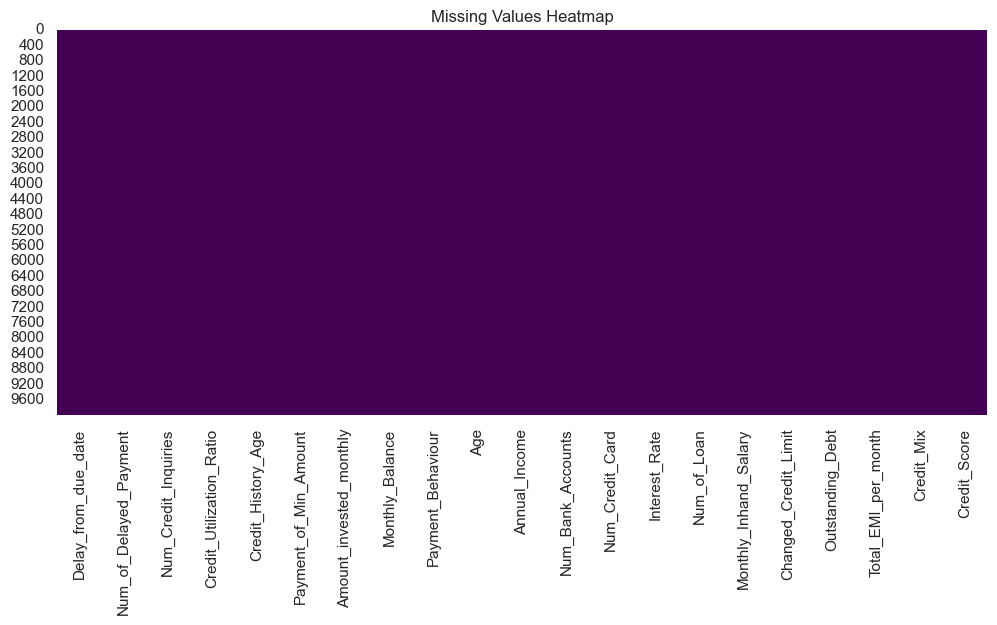

In [14]:
print("Total Missing Values:\n")
print(df.isnull().sum())

# Visualize
plt.figure(figsize=(12,5))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

## Duplicate Rows

In [15]:
print("Duplicate Rows:", df.duplicated().sum())
df[df.duplicated()]

Duplicate Rows: 0


,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Monthly_Balance,Payment_Behaviour,Age,...,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Monthly_Inhand_Salary,Changed_Credit_Limit,Outstanding_Debt,Total_EMI_per_month,Credit_Mix,Credit_Score


## Summary Statistics

In [16]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Delay_from_due_date,9999.0,NaN,NaN,NaN,21.352535,14.60846,0.0,10.0,18.0,28.0,67.0
Num_of_Delayed_Payment,9999.0,NaN,NaN,NaN,13.278128,6.280943,0.0,9.0,14.0,18.0,28.0
Num_Credit_Inquiries,9999.0,NaN,NaN,NaN,5.781978,3.95487,0.0,3.0,5.0,9.0,17.0
Credit_Utilization_Ratio,9999.0,NaN,NaN,NaN,32.286487,5.156126,20.172942,27.969496,32.271204,36.527571,50.0
Credit_History_Age,9999.0,NaN,NaN,NaN,223.70117,97.488211,1.0,151.5,221.0,303.0,404.0
Payment_of_Min_Amount,9999,3,Yes,5264,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Amount_invested_monthly,9999.0,NaN,NaN,NaN,197.643484,194.489238,0.0,74.76453,133.77535,243.434955,1890.855773
Monthly_Balance,9999.0,NaN,NaN,NaN,409.576927,219.101463,0.688299,272.435029,342.665979,480.249182,1602.040519
Payment_Behaviour,9999,6,Low_spent_Small_value_payments,3351,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,9999.0,NaN,NaN,NaN,33.362836,10.72288,14.0,25.0,33.0,42.0,56.0


## Numerical vs Categorical Columns

In [17]:
num_cols = df.select_dtypes(include=['int64','float64']).columns
cat_cols = df.select_dtypes(include=['object','category']).columns

print("Numerical Columns:\n", num_cols)
print("\nCategorical Columns:\n", cat_cols)

Numerical Columns:
 Index(['Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Amount_invested_monthly', 'Monthly_Balance', 'Age', 'Annual_Income',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Monthly_Inhand_Salary', 'Changed_Credit_Limit', 'Outstanding_Debt',
       'Total_EMI_per_month'],
      dtype='object')

Categorical Columns:
 Index(['Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Mix',
       'Credit_Score'],
      dtype='object')


## Univariate Analysis

### Numerical Features (Histogram + Boxplots)

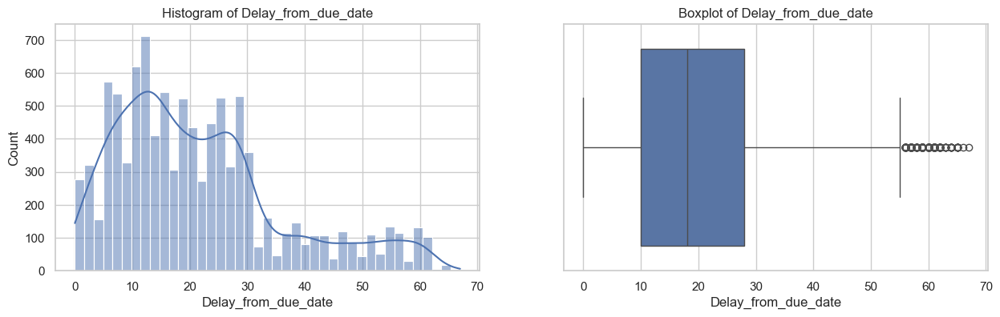

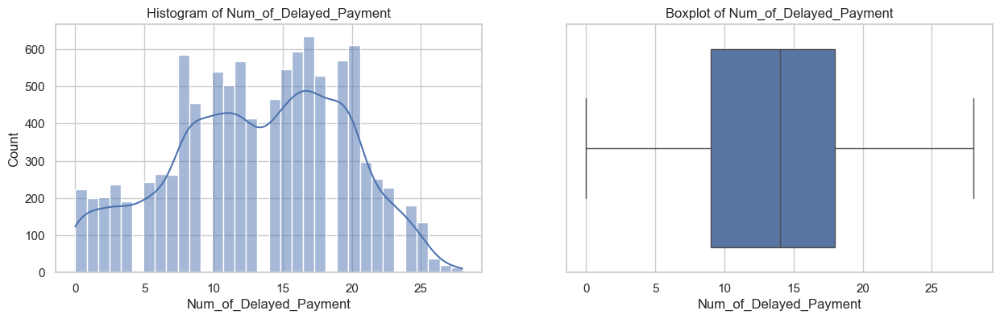

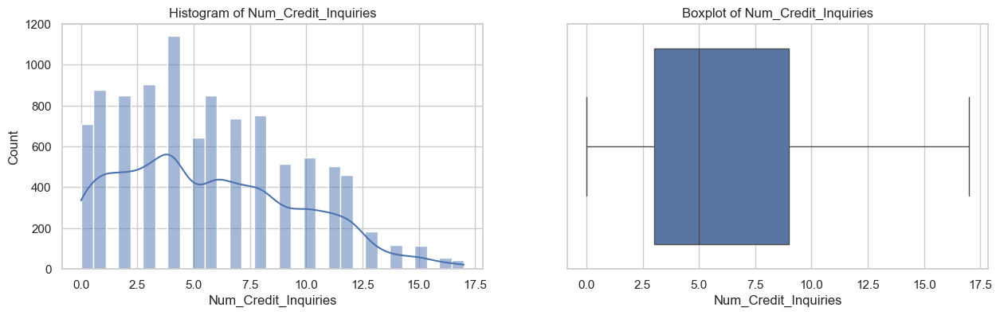

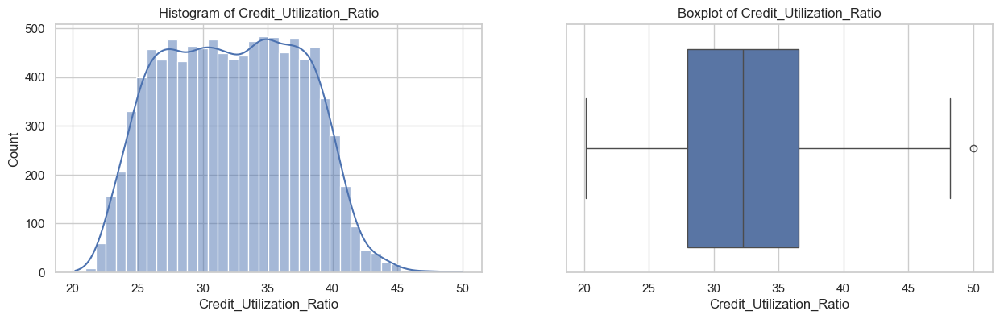

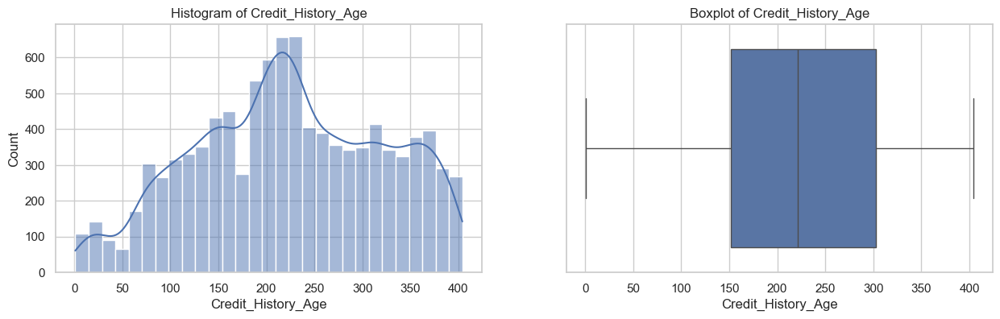

...

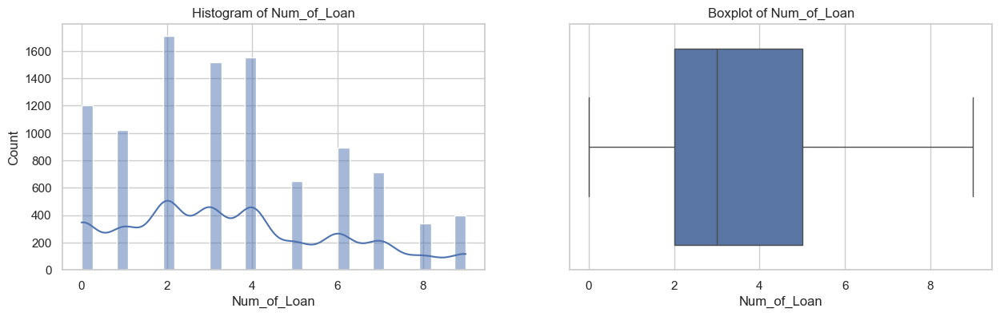

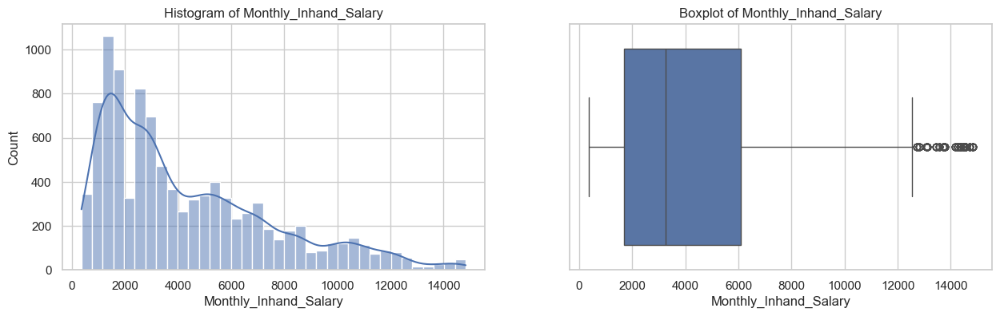

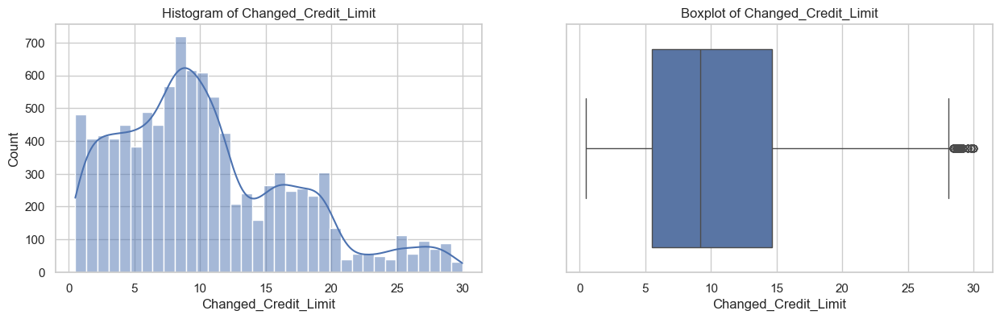

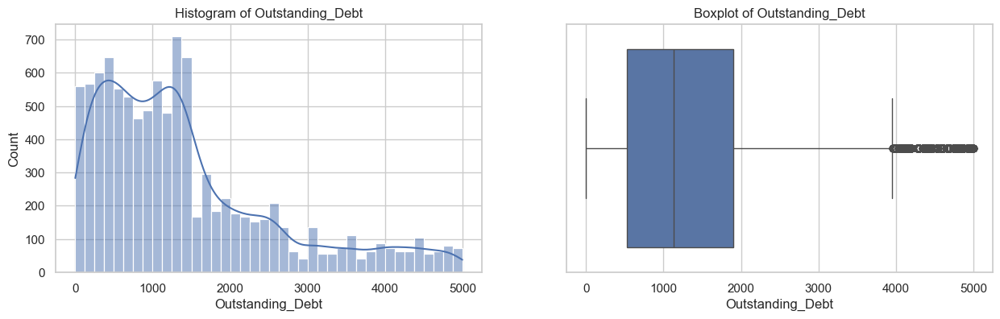

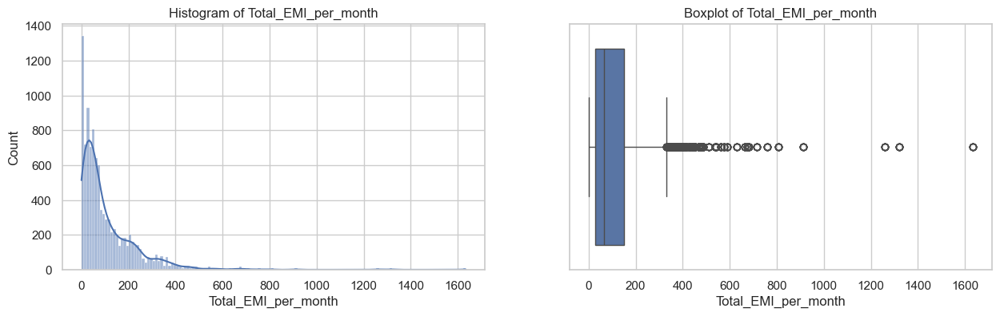

In [18]:
for col in num_cols:
    plt.figure(figsize=(15,4))

    plt.subplot(1,2,1)
    sns.histplot(df[col], kde=True)
    plt.title(f"Histogram of {col}")

    plt.subplot(1,2,2)
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")

    plt.show()

### Categorical Features (Countplots)

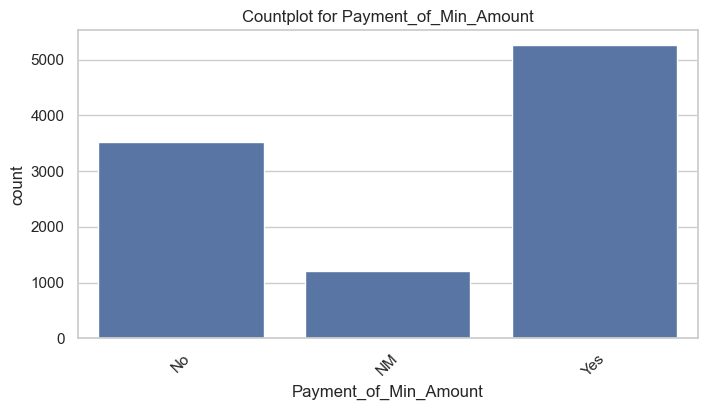

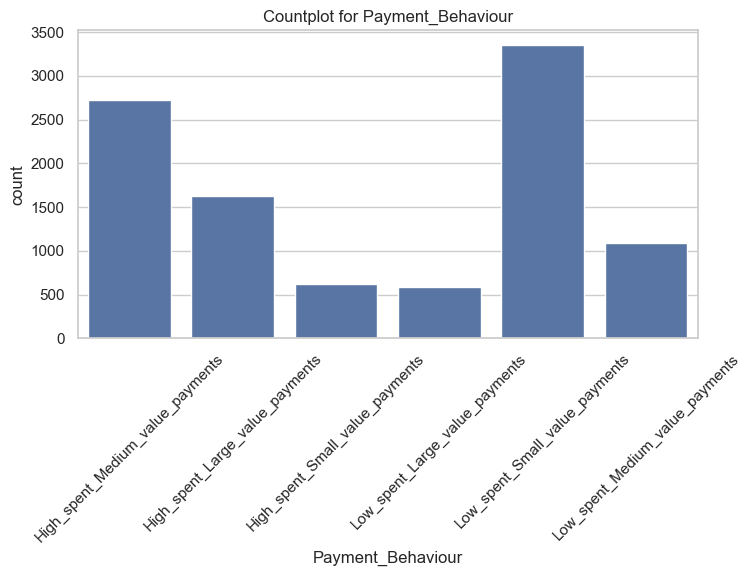

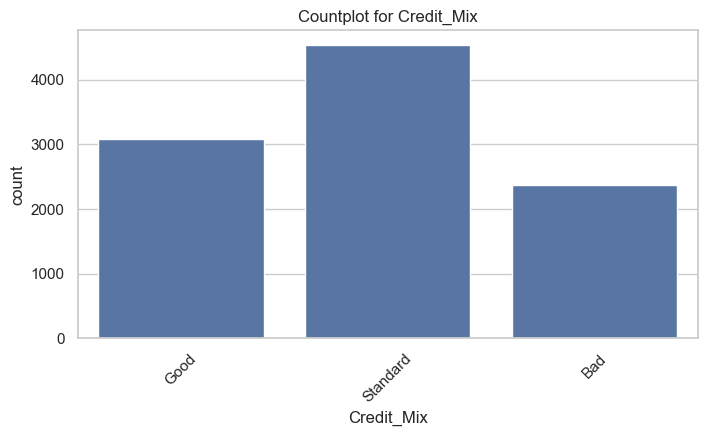

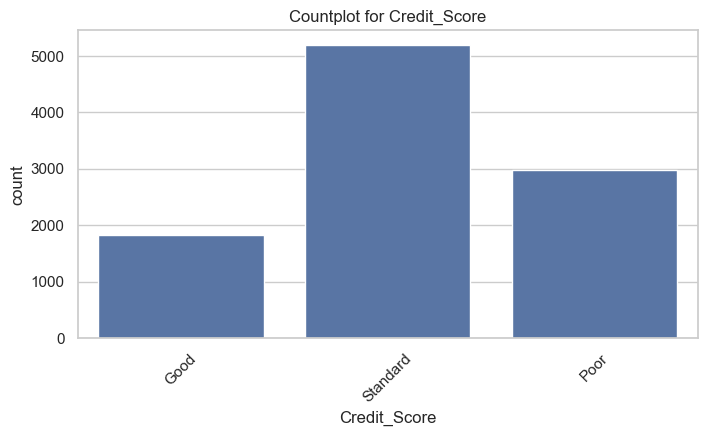

In [19]:
for col in cat_cols:
    plt.figure(figsize=(8,4))
    sns.countplot(x=df[col])
    plt.title(f"Countplot for {col}")
    plt.xticks(rotation=45)
    plt.show()

## Outlier Detection (Z-score or IQR)

In [20]:
outlier_cols = []

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    if len(outliers) > 0:
        outlier_cols.append(col)

print("Columns with outliers:", outlier_cols)

Columns with outliers: ['Delay_from_due_date', 'Credit_Utilization_Ratio', 'Amount_invested_monthly', 'Monthly_Balance', 'Annual_Income', 'Monthly_Inhand_Salary', 'Changed_Credit_Limit', 'Outstanding_Debt', 'Total_EMI_per_month']


## Bivariate Analysis

### Numerical vs Numerical (Scatterplots)

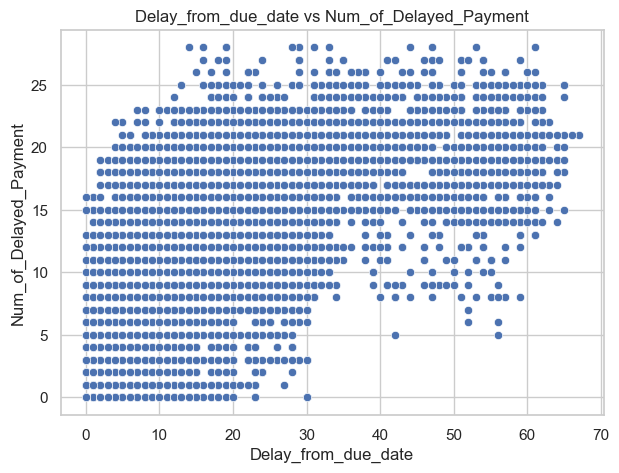

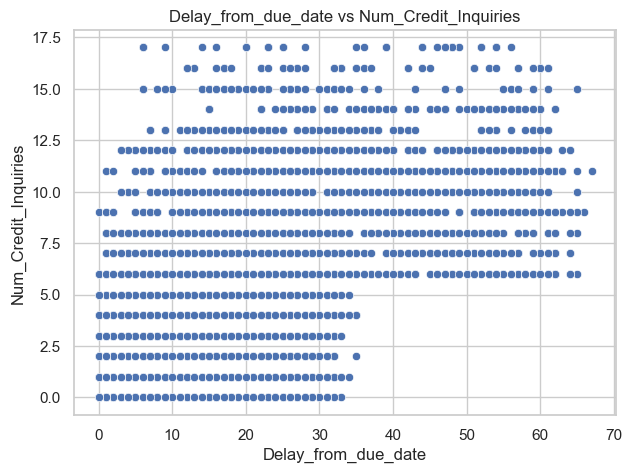

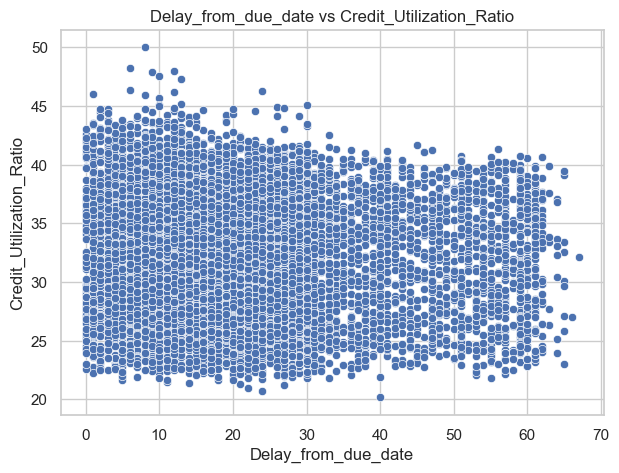

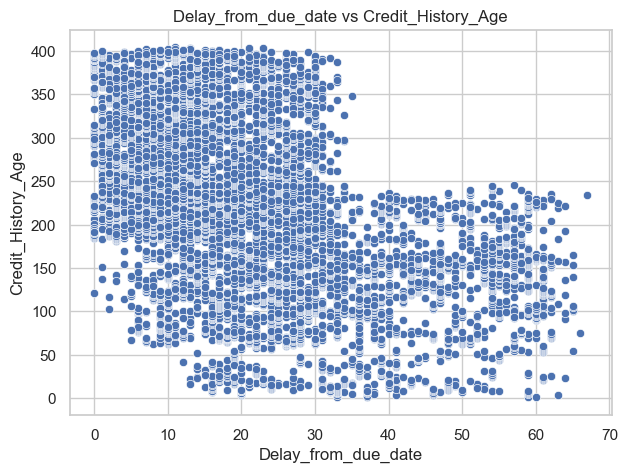

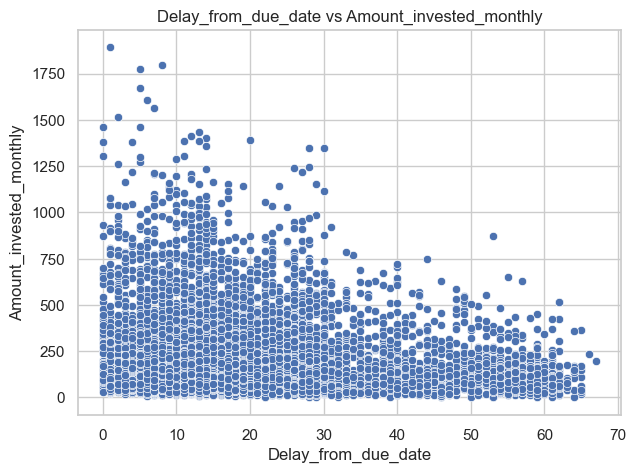

...

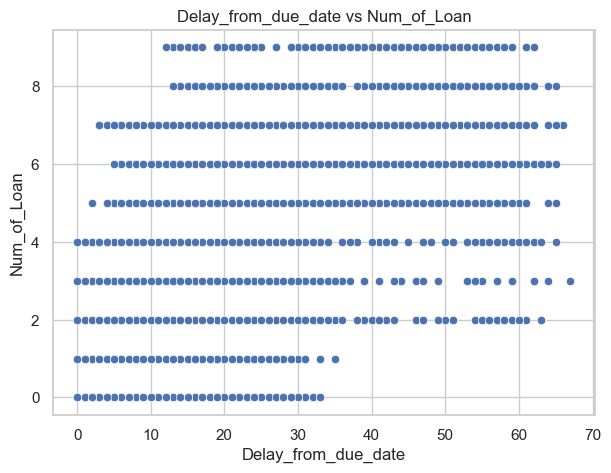

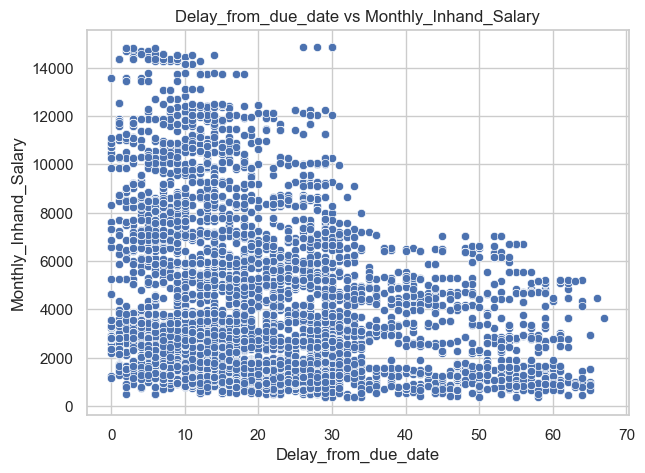

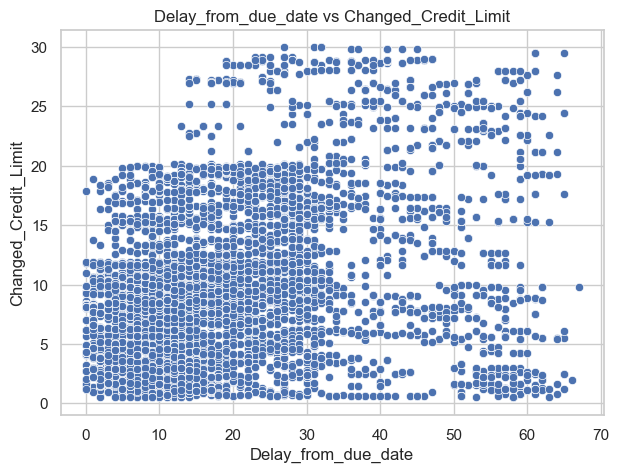

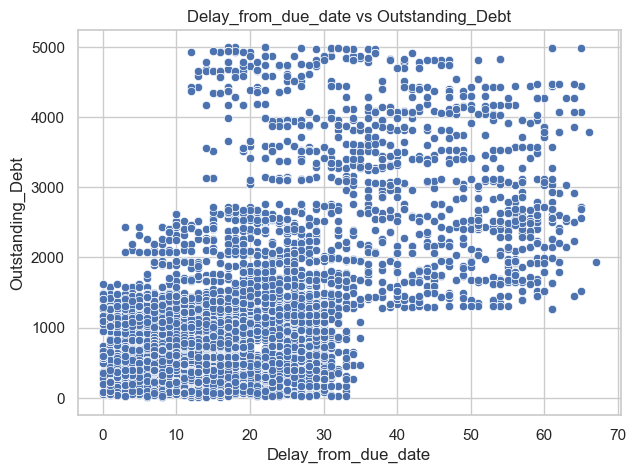

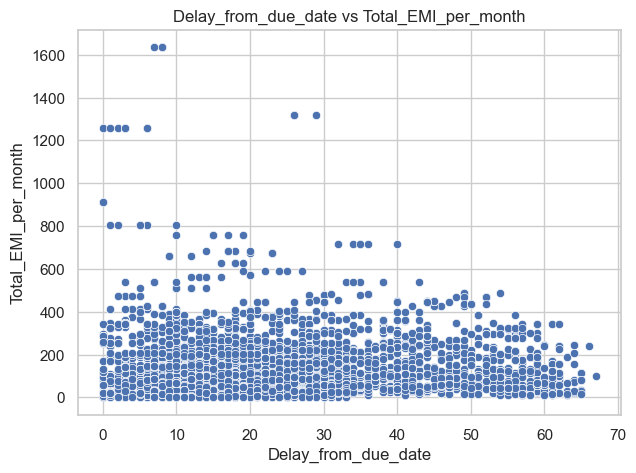

In [21]:
for col in num_cols:
    if col != num_cols[0]:  # Avoid self-scatter
        plt.figure(figsize=(7,5))
        sns.scatterplot(x=df[num_cols[0]], y=df[col])
        plt.title(f"{num_cols[0]} vs {col}")
        plt.show()

### Categorical vs Numerical

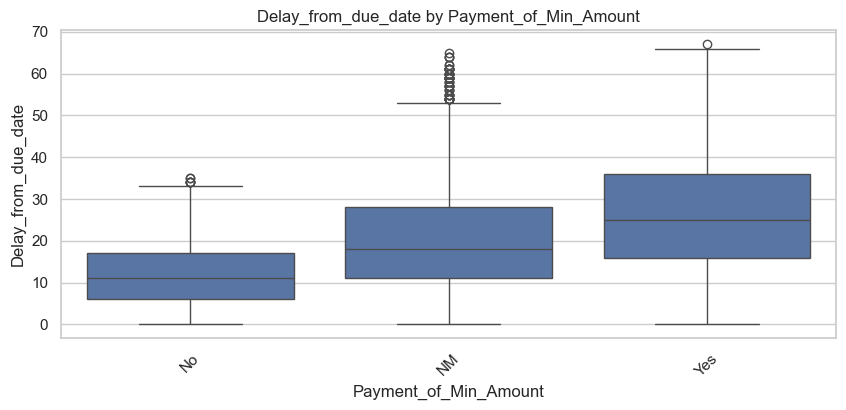

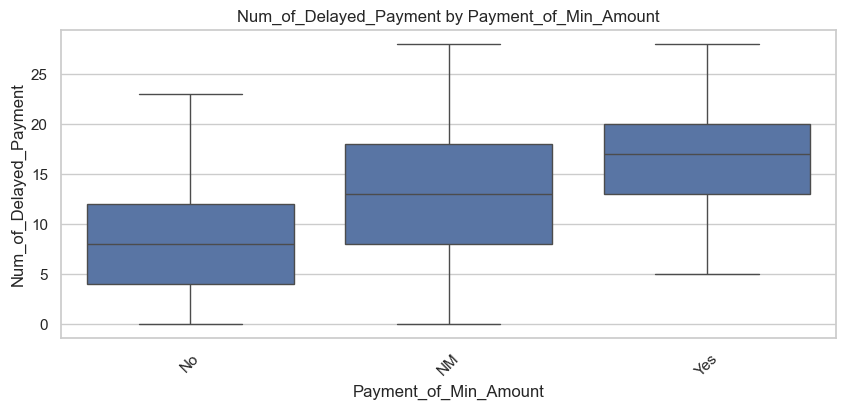

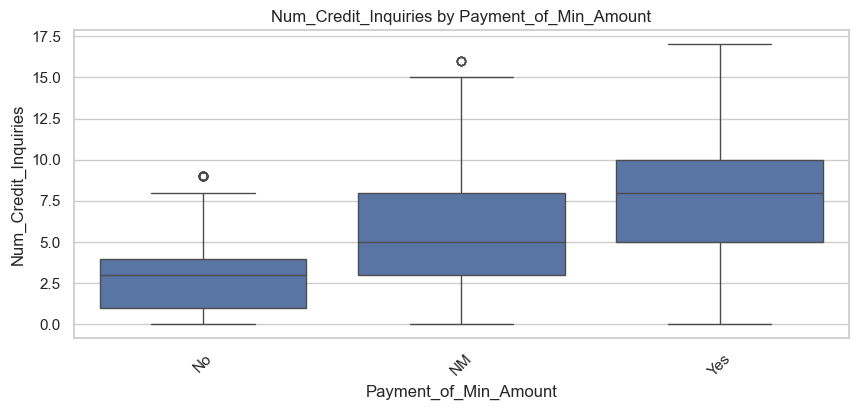

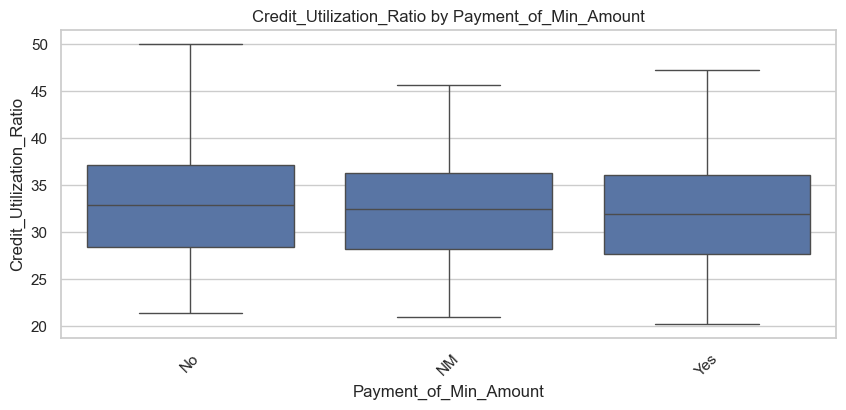

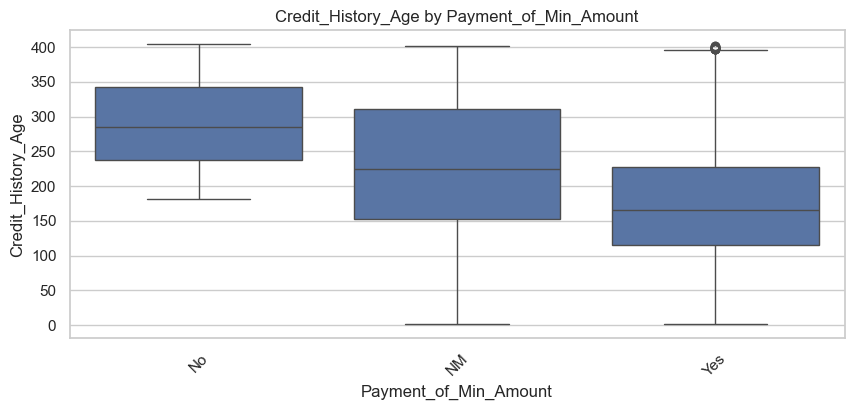

...

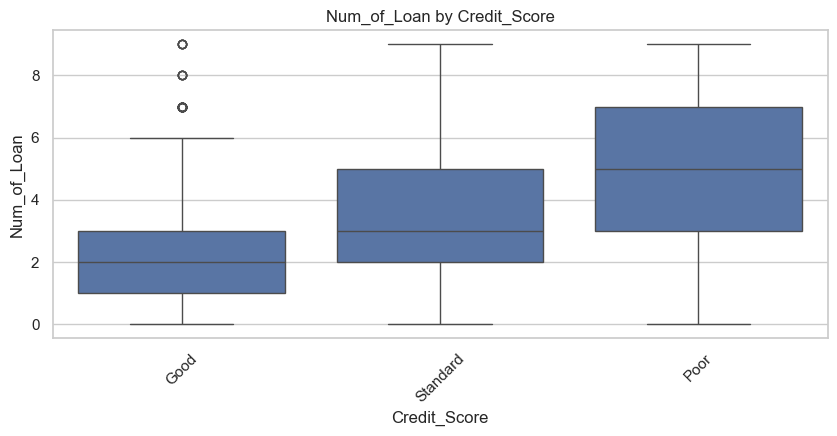

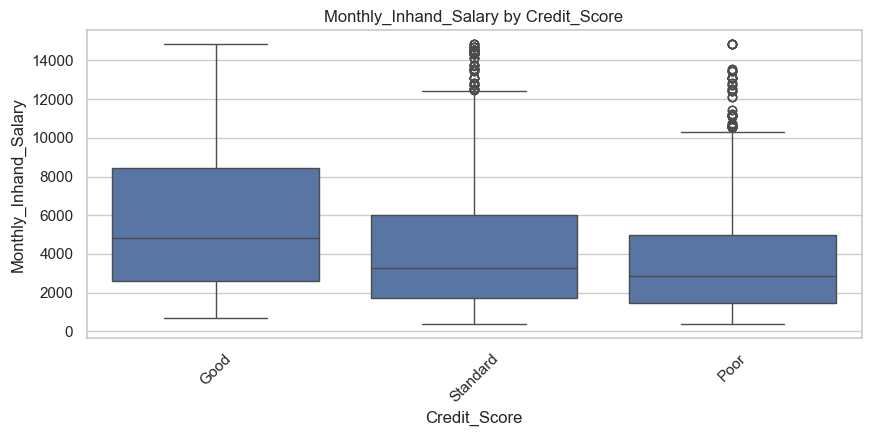

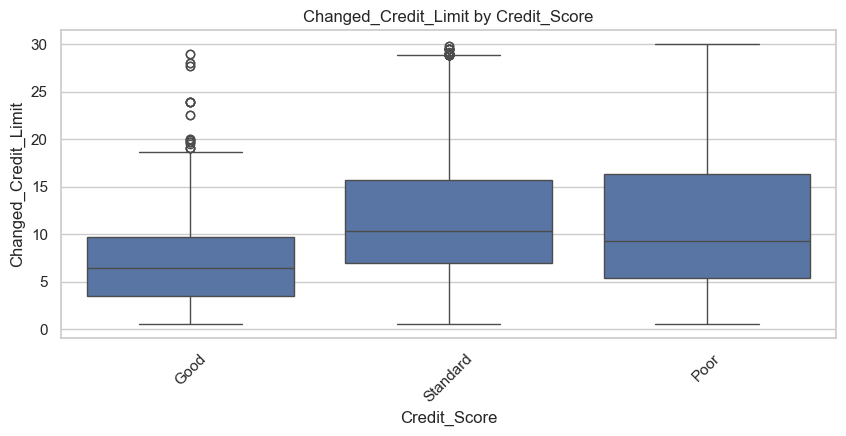

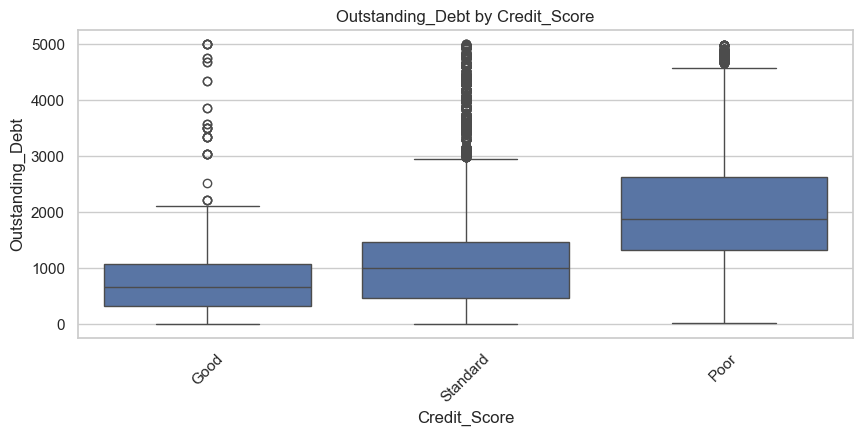

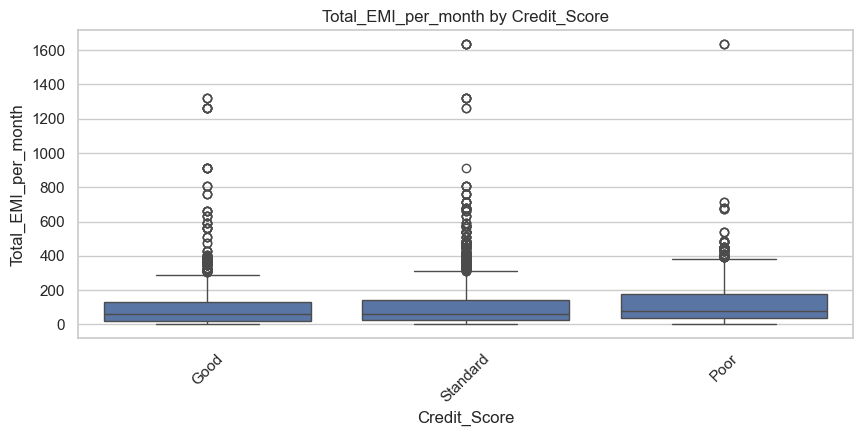

In [22]:
for col in cat_cols:
    for num in num_cols:
        plt.figure(figsize=(10,4))
        sns.boxplot(x=df[col], y=df[num])
        plt.title(f"{num} by {col}")
        plt.xticks(rotation=45)
        plt.show()

## Correlation Analysis

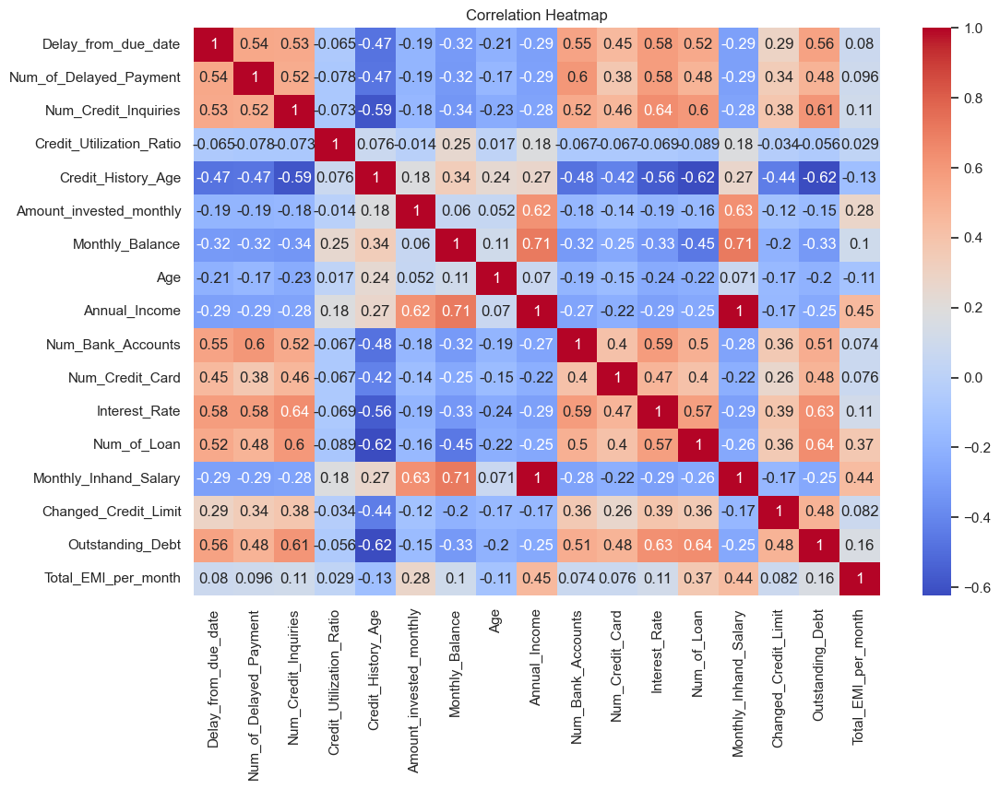

In [23]:
corr = df.corr(numeric_only=True)

plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

ValueError: could not convert string to float: 'No'

## Pairplot (Multivariate)

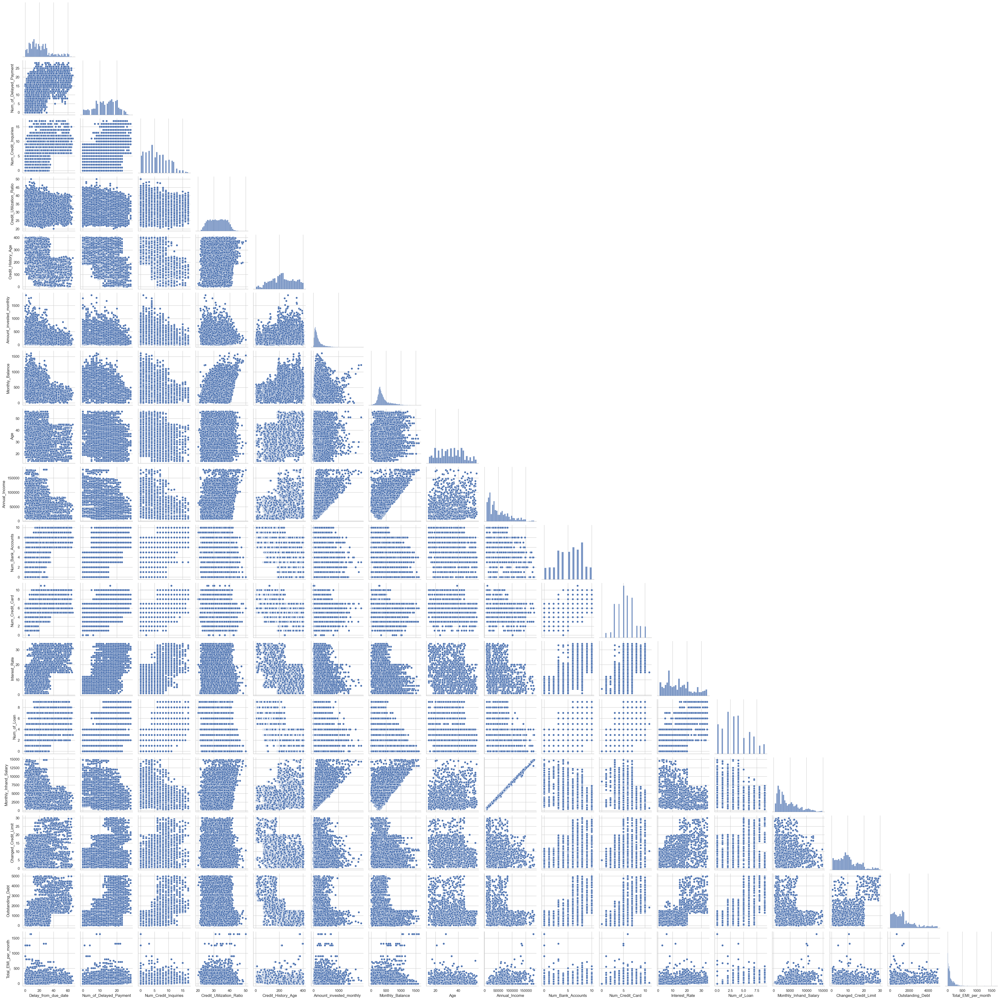

In [24]:
sns.pairplot(df[num_cols], corner=True)
plt.show()

## Skewness & Kurtosis

In [ ]:
for col in num_cols:
    print(f"{col}: Skewness={skew(df[col].dropna()):.2f}, Kurtosis={kurtosis(df[col].dropna()):.2f}")

## Target Variable Detection (Auto)

In [ ]:
target = df.columns[-1]  # last column as target
print("Detected Target Variable:", target)

# Target distribution
sns.countplot(x=df[target])
plt.title("Target Variable Distribution")
plt.show()

## Taking Care of Missing Values

In [ ]:
df_clean = df.copy()

# Numerical imputation
for col in num_cols:
    df_clean[col].fillna(df_clean[col].median(), inplace=True)

# Categorical imputation
for col in cat_cols:
    df_clean[col].fillna(df_clean[col].mode()[0], inplace=True)

## Save Cleaned Data

In [ ]:
df_clean.to_csv("cleaned_dataset.csv", index=False)
print("Dataset Saved as cleaned_dataset.csv")